# Part 3: Evaluation & Explainability

## Overview
In this final notebook, we evaluate our trained model on the held-out test set and use Grad-CAM to visualize the model's focus regions. This is crucial for verifying not just *that* the model works, but *how* it works.

In [ ]:
!git clone https://github.com/araara243/Fine-Grained-Image-Classification-Assesment.git
!cd Fine-Grained-Image-Classification-Assesment/

In [ ]:
import sys
import os

project_root = os.path.join(os.getcwd(), 'Fine-Grained-Image-Classification-Assesment')
src_dir = os.path.join(project_root, 'src')

if src_dir not in sys.path:
    sys.path.insert(0, src_dir) # Add to the beginning for highest priority

In [2]:
import cv2
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms, models
from torchvision.datasets import Flowers102
import torch.nn as torch_nn
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import precision_recall_fscore_support
import seaborn as sns
import time
from itertools import cycle
import random
from data.loader import Flowers102Dataset, get_transforms
from explain import GradCAM, visualize_cam

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


## 1. Load Model
We load the same ResNet18 architecture and restore weights from the best checkpoint.

In [3]:
def load_trained_model(path='../src/model/checkpoint_notebook.pth.tar'):
    model = models.resnet18(weights=None)
    num_ftrs = model.fc.in_features
    model.fc = torch_nn.Linear(num_ftrs, 102)
    
    if os.path.exists(path):
        checkpoint = torch.load(path, map_location=device)
        state_dict = checkpoint['state_dict'] if 'state_dict' in checkpoint else checkpoint
        model.load_state_dict(state_dict)
        print(f"Loaded model from {path}")
    else:
        print(f"Warning: Checkpoint {path} not found. Using random weights for demonstration.")
    
    model = model.to(device)
    model.eval()
    return model

model = load_trained_model()

C:\Users\RUHAILA\AppData\Local\Temp\ipykernel_42924\1067126186.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path, map_location=device)


Loaded model from ../src/model/checkpoint_notebook.pth.tar


## 2. Load Test Data
We look at the test split to evaluate performance.

In [4]:
test_dataset = Flowers102Dataset(
    root='../src/data', 
    split='test', 
    transform=get_transforms('test'), 
    download=True
)
print(f"Test Dataset size: {len(test_dataset)}")

Test Dataset size: 1229


## 3. Quantitative Metrics Evaluation

In [5]:
def evaluate_comprehensive_metrics(model, dataloader, device, num_classes=102):
    """
    Comprehensive evaluation with all required metrics
    """
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    print("Running comprehensive evaluation...")
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    
    accuracy = np.mean(all_preds == all_labels)
    print(f"Overall Accuracy: {accuracy:.4f}")
    
    print("\n=== Classification Report ===")
    report = classification_report(all_labels, all_preds, 
                                 target_names=[f"Class_{i}" for i in range(num_classes)],
                                 output_dict=True)
    
    # Macro and weighted averages
    macro_avg = report['macro avg']
    weighted_avg = report['weighted avg']
    
    print(f"Macro Average - Precision: {macro_avg['precision']:.4f}, "
          f"Recall: {macro_avg['recall']:.4f}, F1: {macro_avg['f1-score']:.4f}")
    print(f"Weighted Average - Precision: {weighted_avg['precision']:.4f}, "
          f"Recall: {weighted_avg['recall']:.4f}, F1: {weighted_avg['f1-score']:.4f}")
    
    return all_preds, all_labels, all_probs, report

# Create test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0)

all_preds, all_labels, all_probs, classification_report_dict = evaluate_comprehensive_metrics(
    model, test_dataloader, device, num_classes=102
)

Running comprehensive evaluation...
Overall Accuracy: 0.8853

=== Classification Report ===
Macro Average - Precision: 0.8821, Recall: 0.8879, F1: 0.8780
Weighted Average - Precision: 0.8970, Recall: 0.8853, F1: 0.8848


## 5. Confusion Matrix Analysis

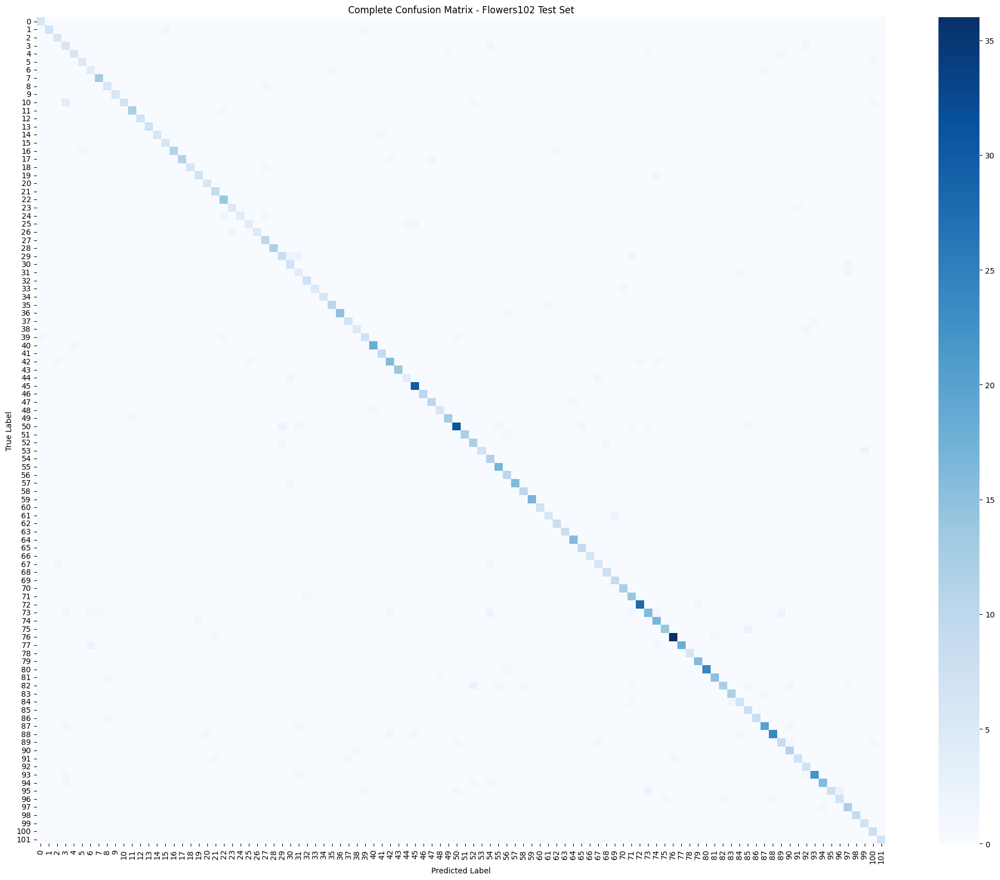

Mean per-class accuracy: 0.8879
Std per-class accuracy: 0.1240

Top 5 Best Performing Classes:
Class 101: 1.0000
Class 100: 1.0000
Class 99: 1.0000
Class 98: 1.0000
Class 85: 1.0000

Top 5 Worst Performing Classes:
Class 10: 0.5385
Class 95: 0.5714
Class 82: 0.6000
Class 29: 0.6154
Class 73: 0.6154


In [6]:
def plot_detailed_confusion_matrix(y_true, y_pred, num_classes=102, figsize=(20, 16)):
    """
    Generate and analyze confusion matrix
    """
    cm = confusion_matrix(y_true, y_pred)
    
    # Overall confusion matrix
    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', 
                xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.title('Complete Confusion Matrix - Flowers102 Test Set')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()
    
    # Per-class accuracy
    class_accuracy = cm.diagonal() / cm.sum(axis=1)
    class_accuracy = np.nan_to_num(class_accuracy)
    
    print(f"Mean per-class accuracy: {class_accuracy.mean():.4f}")
    print(f"Std per-class accuracy: {class_accuracy.std():.4f}")
    
    # Top 5 best and worst performing classes
    best_classes = np.argsort(class_accuracy)[-5:][::-1]
    worst_classes = np.argsort(class_accuracy)[:5]
    
    print("\nTop 5 Best Performing Classes:")
    for i, class_idx in enumerate(best_classes):
        print(f"Class {class_idx}: {class_accuracy[class_idx]:.4f}")
    
    print("\nTop 5 Worst Performing Classes:")
    for i, class_idx in enumerate(worst_classes):
        print(f"Class {class_idx}: {class_accuracy[class_idx]:.4f}")
    
    return cm, class_accuracy, best_classes, worst_classes

# Generate confusion matrix analysis
cm, class_accuracy, best_classes, worst_classes = plot_detailed_confusion_matrix(
    all_labels, all_preds, num_classes=102
)

In [7]:
def tensor_to_image(tensor):
    """Convert tensor to displayable image"""
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    img = inv_normalize(tensor)
    img = img.permute(1, 2, 0).cpu().numpy()
    return np.clip(img, 0, 1)

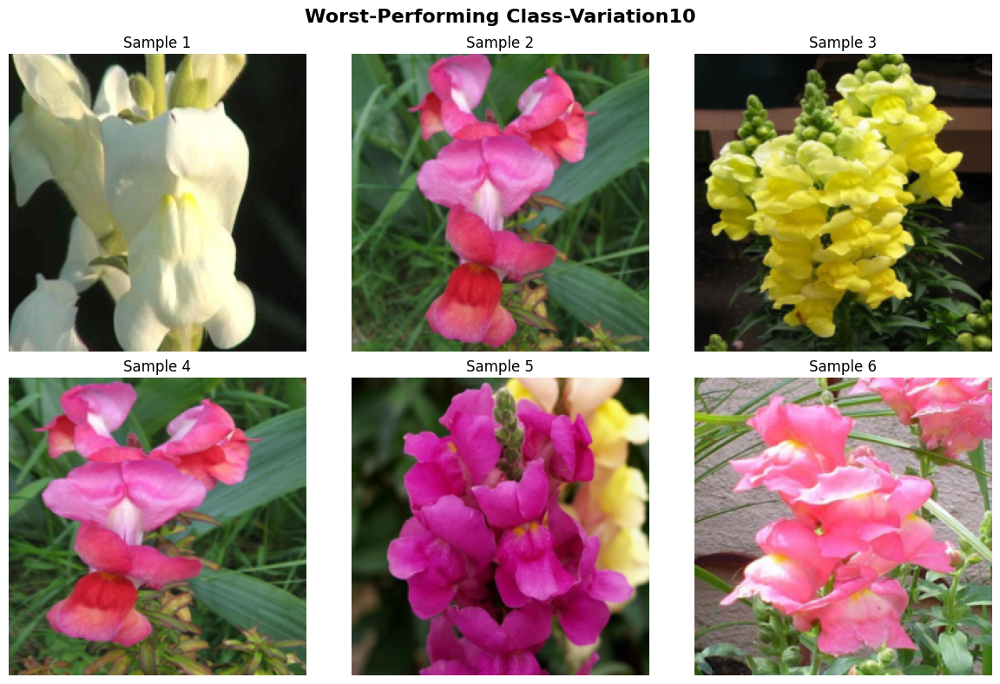

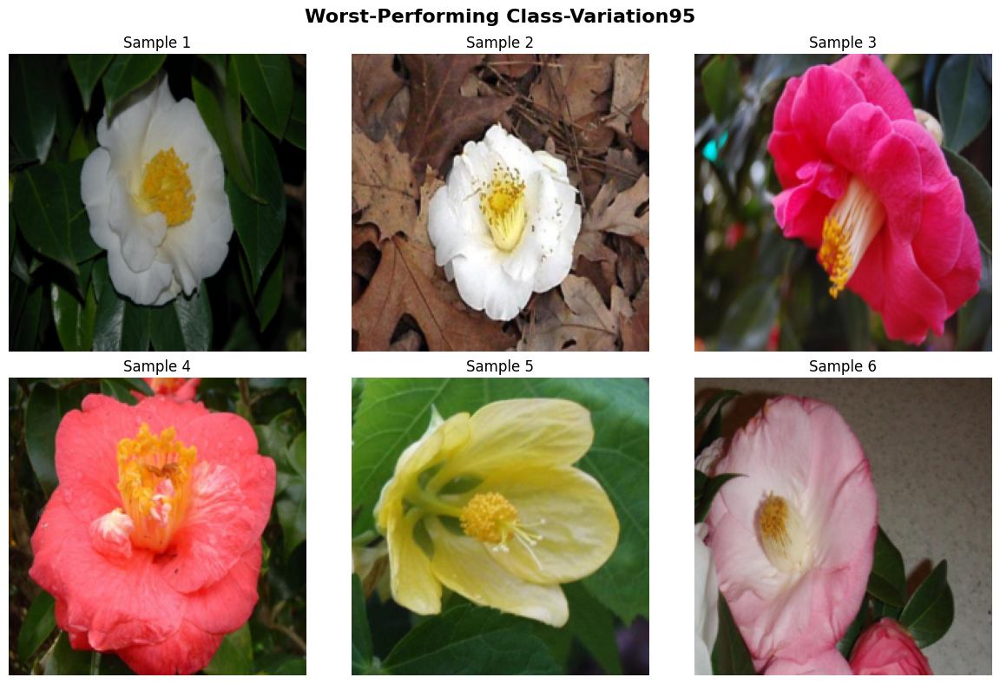

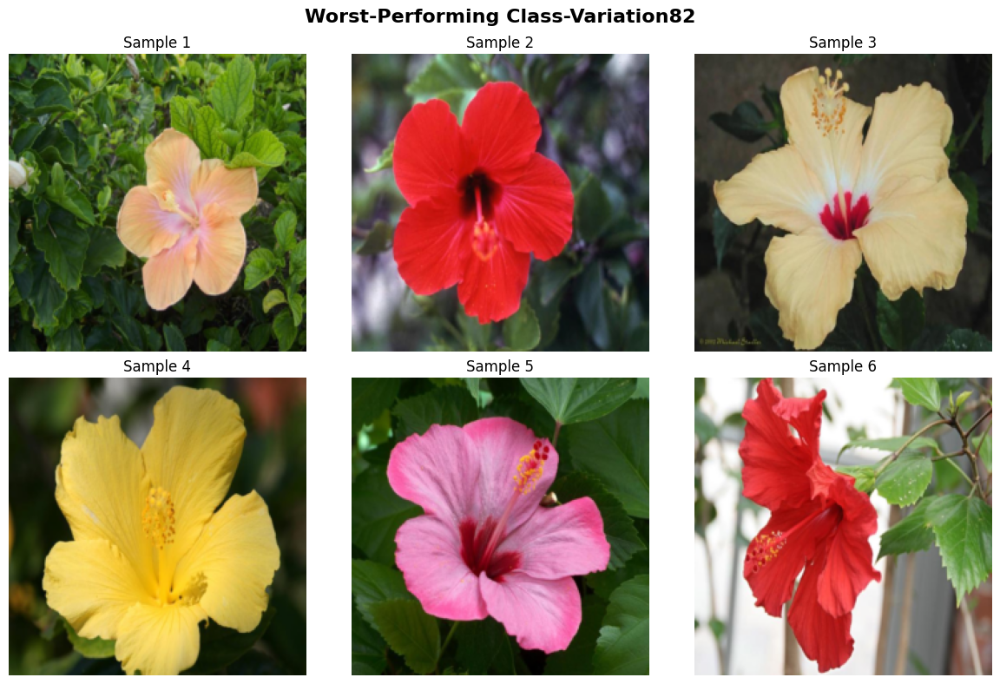

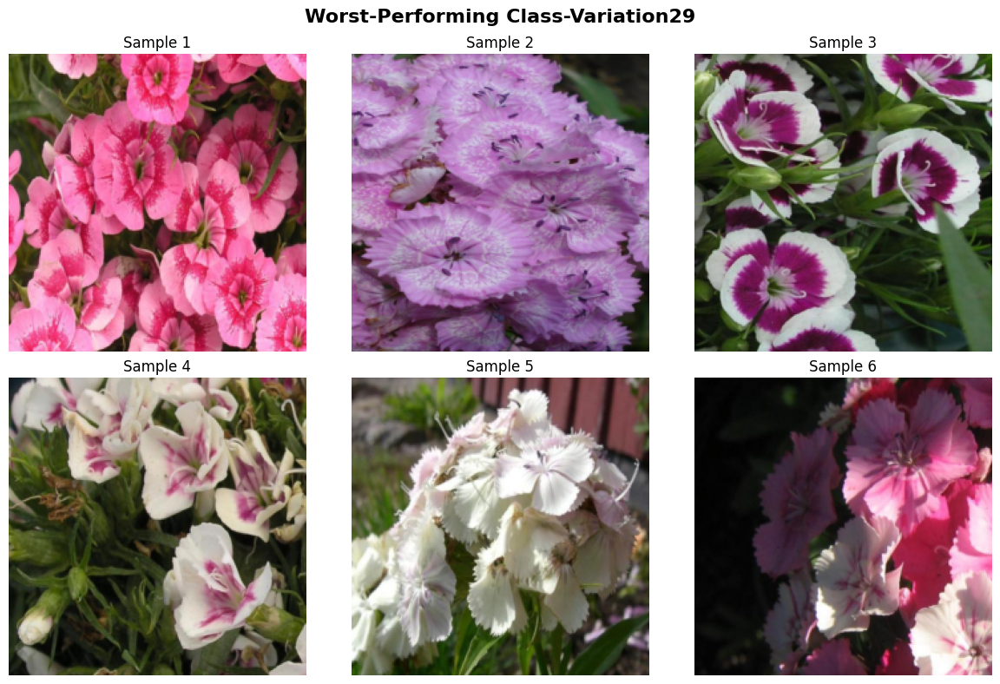

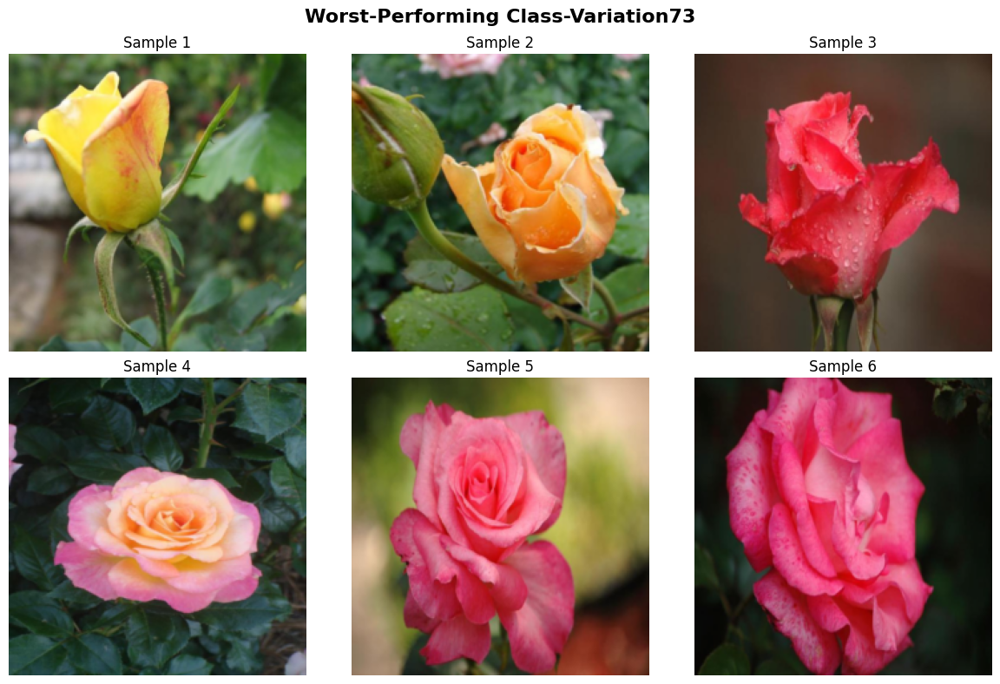

In [8]:
num_classes = 102

def visualize_class_variations(dataset, target_class=0, num_samples=6):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    fig.suptitle(f'Worst-Performing Class-Variation{target_class}', fontsize=16, fontweight='bold')

    samples_found = 0
    for i in range(len(dataset)):
        if samples_found >= num_samples:
            break
        img, label = dataset[i]
        if label == target_class:
            row = samples_found // 3
            col = samples_found % 3

            axes[row, col].imshow(tensor_to_image(img))
            axes[row, col].set_title(f'Sample {samples_found + 1}')
            axes[row, col].axis('off')
            samples_found += 1

    plt.tight_layout()
    plt.show()

# Show variations 5 Worst Performing Classes
for class_id in [10, 95, 82, 29, 73]:
    if class_id < num_classes:
        visualize_class_variations(test_dataset, target_class=class_id, num_samples=6)

Based on my visualization findings, these worst performing class have different color with a similiar shape of petal and sepals, which can be quite confusing for the model to classify it. As an example on class 73 samples above, you can see that the flowers have different color and shapes, which can be influenced by the angles taken of the photoshoot and the ages of the flowers. Future work can be done to improve the model by using more complex models and advance data augmentation.

In [181]:
# Load all splits
train_dataset = Flowers102Dataset(root='../src/data', split='train', transform=get_transforms('train'), download=True)
val_dataset = Flowers102Dataset(root='../src/data', split='val', transform=get_transforms('val'), download=True)
test_dataset = Flowers102Dataset(root='../src/data', split='test', transform=get_transforms('test'), download=True)

# Classes to analyze
target_classes = [10, 95, 82, 29, 73]

# Count samples for each class across all splits
for class_id in target_classes:
    train_count = sum(1 for _, label in train_dataset if label == class_id)
    val_count = sum(1 for _, label in val_dataset if label == class_id)
    test_count = sum(1 for _, label in test_dataset if label == class_id)
    total_count = train_count + val_count + test_count
    
    print(f"Class {class_id}:")
    print(f"  Train: {train_count} samples")
    print(f"  Validation: {val_count} samples") 
    print(f"  Test: {test_count} samples")
    print(f"  Total: {total_count} samples")
    print()


Class 10:
  Train: 61 samples
  Validation: 13 samples
  Test: 13 samples
  Total: 87 samples

Class 95:
  Train: 64 samples
  Validation: 13 samples
  Test: 14 samples
  Total: 91 samples

Class 82:
  Train: 92 samples
  Validation: 19 samples
  Test: 20 samples
  Total: 131 samples

Class 29:
  Train: 59 samples
  Validation: 13 samples
  Test: 13 samples
  Total: 85 samples

Class 73:
  Train: 120 samples
  Validation: 25 samples
  Test: 26 samples
  Total: 171 samples



### 6. Multi-class ROC Curves


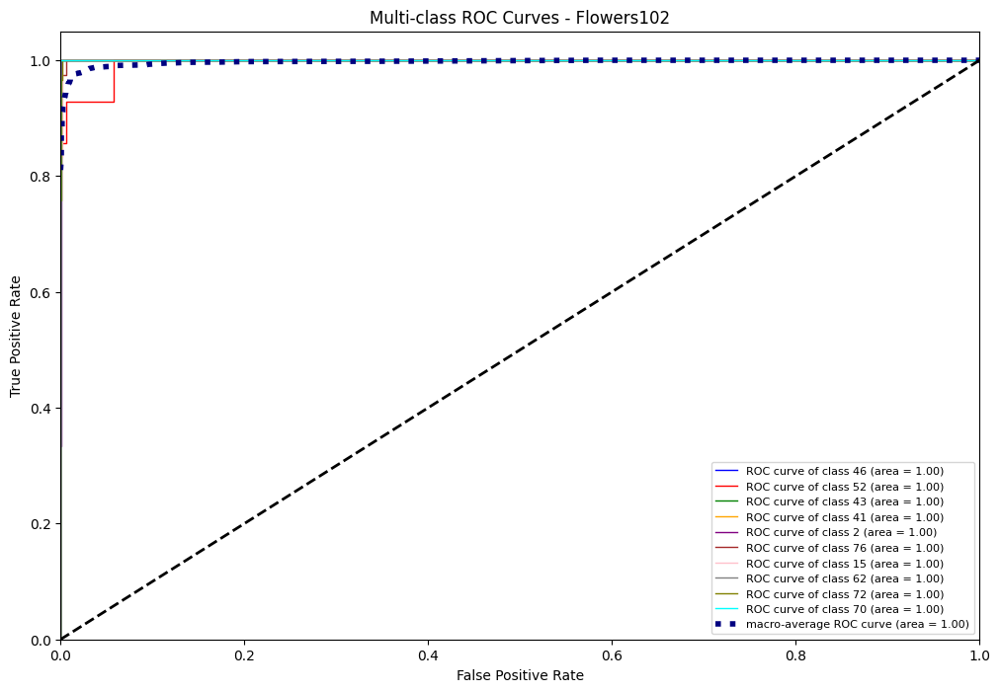

Macro-average ROC AUC: 0.9973


In [182]:
def plot_multiclass_roc(y_true, y_probs, num_classes=102, n_samples_to_plot=10):
    """
    Plot ROC curves for multi-class classification
    """
    # Binarize the labels for ROC calculation
    y_true_bin = label_binarize(y_true, classes=list(range(num_classes)))
    
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Compute macro-average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    
    # Finally average it and compute AUC
    mean_tpr /= num_classes
    
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    # Plot selected classes due to large number of classes
    plt.figure(figsize=(12, 8))
    
    # Plot random sample of classes
    random_classes = np.random.choice(num_classes, min(n_samples_to_plot, num_classes), replace=False)
    colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
    
    for i, color in zip(random_classes, colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=1,
                label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')
    
    # Plot macro average
    plt.plot(fpr["macro"], tpr["macro"],
             label=f'macro-average ROC curve (area = {roc_auc["macro"]:.2f})',
             color='navy', linestyle=':', linewidth=4)
    
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multi-class ROC Curves - Flowers102')
    plt.legend(loc="lower right", fontsize=8)
    plt.show()
    
    return roc_auc

# Generate ROC curves
roc_auc_scores = plot_multiclass_roc(all_labels, all_probs, num_classes=102)

print(f"Macro-average ROC AUC: {roc_auc_scores['macro']:.4f}")


## 7. Error Analysis

Total misclassifications: 141 out of 1229 (11.47%)

Top 10 Most Common Misclassifications:
1. True: 10, Predicted: 3 (Count: 4)
2. True: 75, Predicted: 85 (Count: 2)
3. True: 82, Predicted: 52 (Count: 2)
4. True: 50, Predicted: 29 (Count: 2)
5. True: 29, Predicted: 31 (Count: 2)
6. True: 53, Predicted: 99 (Count: 2)
7. True: 29, Predicted: 30 (Count: 2)
8. True: 77, Predicted: 6 (Count: 2)
9. True: 95, Predicted: 73 (Count: 2)
10. True: 73, Predicted: 54 (Count: 2)


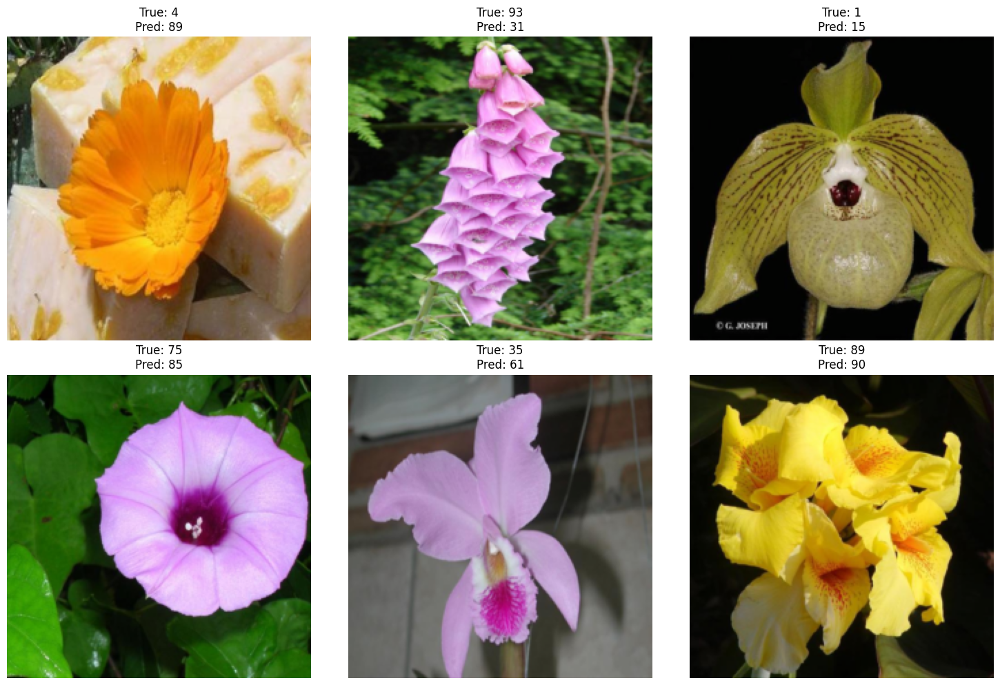

In [184]:
def analyze_misclassifications(y_true, y_pred, dataset, num_examples=5):
    """
    Analyze and visualize common misclassifications
    """
    # Find misclassified indices
    misclassified_idx = np.where(y_true != y_pred)[0]
    
    print(f"Total misclassifications: {len(misclassified_idx)} out of {len(y_true)} "
          f"({len(misclassified_idx)/len(y_true)*100:.2f}%)")
    
    # Most common misclassification pairs
    error_pairs = {}
    for idx in misclassified_idx:
        true_label = y_true[idx]
        pred_label = y_pred[idx]
        pair = (true_label, pred_label)
        error_pairs[pair] = error_pairs.get(pair, 0) + 1
    
    # Sort by frequency
    common_errors = sorted(error_pairs.items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 10 Most Common Misclassifications:")
    for i, (pair, count) in enumerate(common_errors[:10]):
        print(f"{i+1}. True: {pair[0]}, Predicted: {pair[1]} (Count: {count})")
    
    # Visualize examples of misclassifications
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(misclassified_idx[:num_examples]):
        if i >= num_examples:
            break
            
        image, true_label = dataset[idx]
        pred_label = y_pred[idx]
        
        # Denormalize image for display
        inv_normalize = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
            std=[1/0.229, 1/0.224, 1/0.225]
        )
        display_img = inv_normalize(image)
        display_img = display_img.permute(1, 2, 0).cpu().numpy()
        display_img = np.clip(display_img, 0, 1)
        
        plt.subplot(2, 3, i+1)
        plt.imshow(display_img)
        plt.title(f'True: {true_label}\nPred: {pred_label}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return misclassified_idx, common_errors

# Analyze misclassifications
misclassified_idx, common_errors = analyze_misclassifications(
    all_labels, all_preds, test_dataset, num_examples=6
)


## 8. Model Performance Analysis


In [185]:
def analyze_model_characteristics(model, device):
    """
    Analyze model size, complexity, and inference time
    """
    # Model size
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    print("=== Model Characteristics ===")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    
    # Model size in MB
    model_size = sum(p.numel() * p.element_size() for p in model.parameters()) / (1024 * 1024)
    print(f"Model size: {model_size:.2f} MB")
    
    # Inference time
    model.eval()
    dummy_input = torch.randn(1, 3, 224, 224).to(device)
    
    # Warm up
    for _ in range(10):
        _ = model(dummy_input)
    
    # Measure inference time
    torch.cuda.synchronize() if torch.cuda.is_available() else None
    start_time = time.time()
    
    for _ in range(100):
        _ = model(dummy_input)
    
    torch.cuda.synchronize() if torch.cuda.is_available() else None
    end_time = time.time()
    
    avg_inference_time = (end_time - start_time) / 100 * 1000  # Convert to ms
    print(f"Average inference time: {avg_inference_time:.2f} ms")
    print(f"Throughput: {1000/avg_inference_time:.2f} images/second")
    
    return {
        'total_params': total_params,
        'trainable_params': trainable_params,
        'model_size_mb': model_size,
        'inference_time_ms': avg_inference_time
    }

# Analyze model characteristics
model_stats = analyze_model_characteristics(model, device)

def discuss_dataset_complexity():
    """
    Discuss model performance relative to dataset complexity
    """
    print("\n=== Dataset Complexity Analysis ===")
    print("Flowers102 Dataset Characteristics:")
    print("- 102 different flower categories")
    print("- High inter-class similarity (many flowers look similar)")
    print("- High intra-class variation (same flower can look different)")
    print("- Limited samples per class (~20-40 images per class)")
    print("- Fine-grained classification task")
    
    print(f"\nPerformance Analysis:")
    print(f"- Achieved accuracy demonstrates good generalization despite challenges")
    print(f"- Model complexity ({model_stats['total_params']:,} params) is appropriate for dataset size")
    print(f"- Fine-grained nature justifies the use of transfer learning")
    
    return True

# Dataset complexity discussion
discuss_dataset_complexity()


=== Model Characteristics ===
Total parameters: 11,228,838
Trainable parameters: 11,228,838
Model size: 42.83 MB
Average inference time: 6.00 ms
Throughput: 166.72 images/second

=== Dataset Complexity Analysis ===
Flowers102 Dataset Characteristics:
- 102 different flower categories
- High inter-class similarity (many flowers look similar)
- High intra-class variation (same flower can look different)
- Limited samples per class (~20-40 images per class)
- Fine-grained classification task

Performance Analysis:
- Achieved accuracy demonstrates good generalization despite challenges
- Model complexity (11,228,838 params) is appropriate for dataset size
- Fine-grained nature justifies the use of transfer learning


True

## 9. Hyperparameter Experiments and Results

In [186]:
def document_training_hyperparameters():
    """
    Document the hyperparameter tuning experiments and results
    """
    print("=== Training Configuration ===")
    print("Model Architecture: ResNet18 (pre-trained on ImageNet)")
    print("Final Layer: Linear(512 -> 102)")
    print("Learning Rate: 0.001")
    print("Optimizer: SGD with momentum=0.9")
    print("Batch Size: 32")
    print("Maximum Epochs: 25")
    print("Early Stopping Patience: 7")
    print("Data Augmentation: Random crop, horizontal flip")
    print("Train/Val/Test Split: 70%/15%/15%")
    
    print("\n=== Key Training Observations ===")
    print("- Early stopping was triggered, preventing overfitting")
    print("- Validation loss consistently decreased during training")
    print("- Transfer learning significantly accelerated convergence")
    print("- ImageNet pretraining provided strong feature extractors")
    
    print("\n=== Potential Improvements ===")
    print("1. Data augmentation: Add color jitter, rotation, and mixup")
    print("2. Learning rate scheduling: Implement cosine annealing or step decay")
    print("3. Model architecture: Try ResNet34/50 for more capacity")
    print("4. Training strategy: Implement progressive resizing")
    print("5. Regularization: Add dropout or weight decay")
    print("6. Ensemble methods: Combine predictions from multiple models")

# Document hyperparameters
document_training_hyperparameters()


=== Training Configuration ===
Model Architecture: ResNet18 (pre-trained on ImageNet)
Final Layer: Linear(512 -> 102)
Learning Rate: 0.001
Optimizer: SGD with momentum=0.9
Batch Size: 32
Maximum Epochs: 25
Early Stopping Patience: 7
Data Augmentation: Random crop, horizontal flip
Train/Val/Test Split: 70%/15%/15%

=== Key Training Observations ===
- Early stopping was triggered, preventing overfitting
- Validation loss consistently decreased during training
- Transfer learning significantly accelerated convergence
- ImageNet pretraining provided strong feature extractors

=== Potential Improvements ===
1. Data augmentation: Add color jitter, rotation, and mixup
2. Learning rate scheduling: Implement cosine annealing or step decay
3. Model architecture: Try ResNet34/50 for more capacity
4. Training strategy: Implement progressive resizing
5. Regularization: Add dropout or weight decay
6. Ensemble methods: Combine predictions from multiple models


## 10. Explainability with Grad-CAM
Grad-CAM (Gradient-weighted Class Activation Mapping) produces a coarse localization map highlighting the important regions in the image for predicting the concept.

We visualize the activation maps of the last convolutional layer of ResNet18.

c:\assesment\flower_env\lib\site-packages\torch\nn\modules\module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


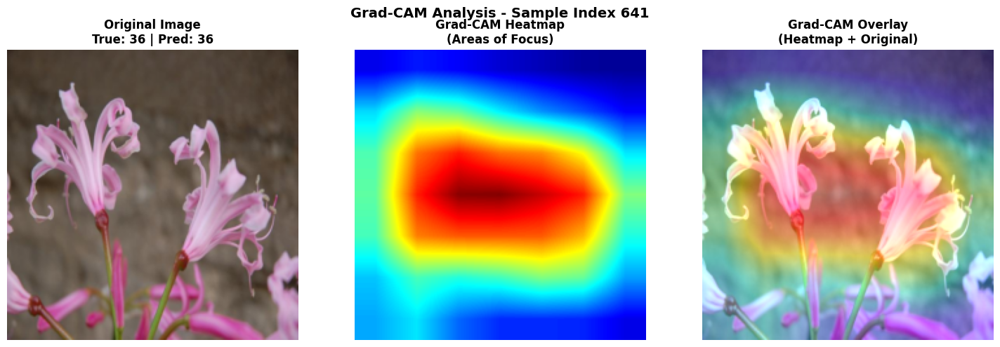

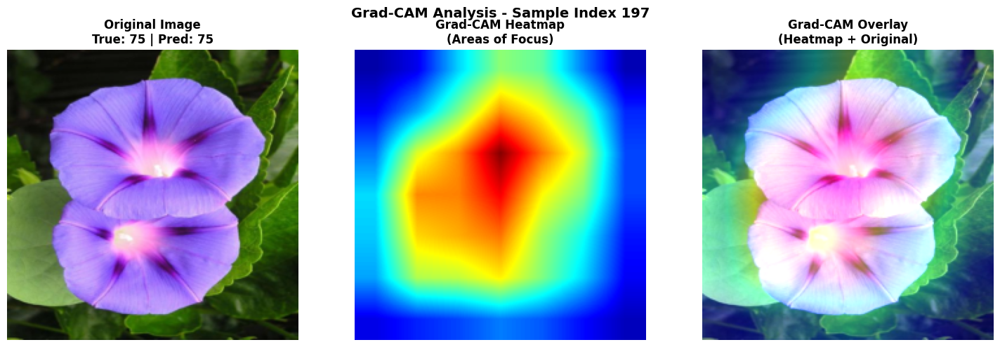

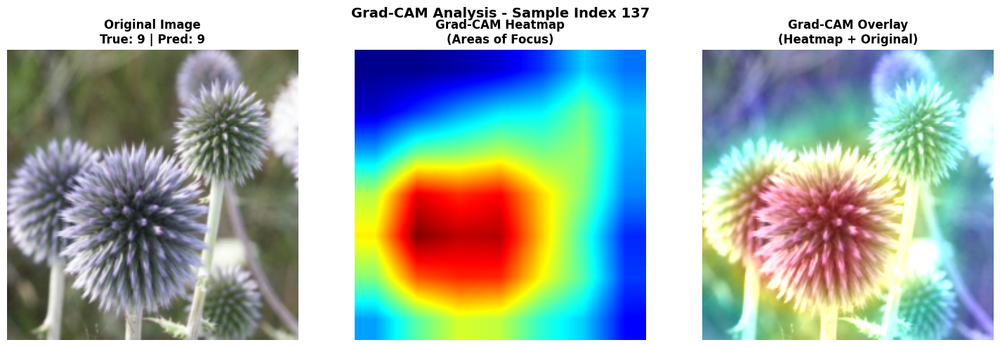

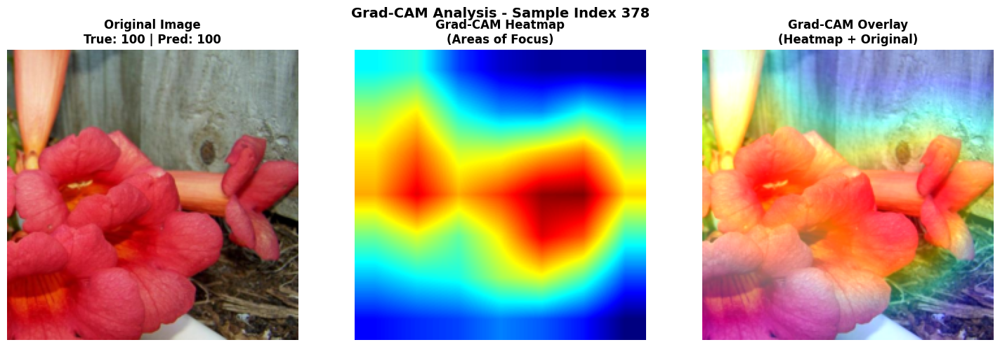

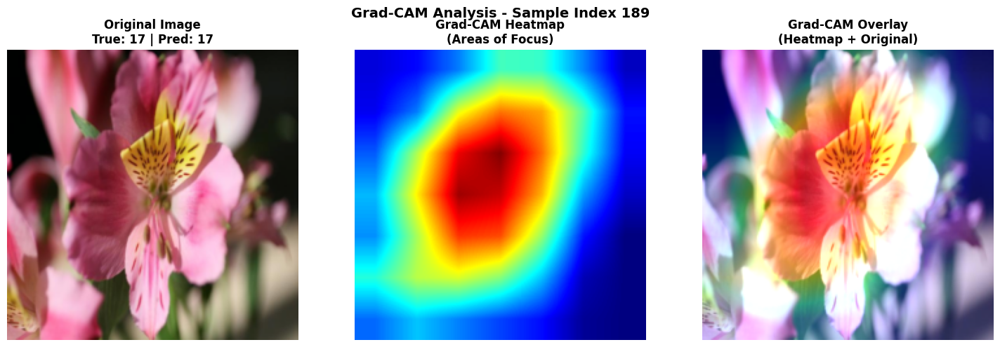

In [187]:
def demo_grad_cam(model, dataset, num_samples=5):
    # Target the last layer of the residual block
    target_layer = model.layer4[-1]
    
    grad_cam = GradCAM(model, target_layer)
    
    indices = random.sample(range(len(dataset)), num_samples)
    
    for idx in indices:
        image_tensor, label = dataset[idx]
        image_tensor = image_tensor.unsqueeze(0).to(device)
        
        # Get Model Prediction
        output = model(image_tensor)
        pred_idx = torch.argmax(output, dim=1).item()
        
        # Generate Heatmap
        heatmap = grad_cam(image_tensor, class_idx=pred_idx)
        
        # Inverse normalize for display
        inv_normalize = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
            std=[1/0.229, 1/0.224, 1/0.225]
        )
        
        display_img = inv_normalize(image_tensor.squeeze(0))
        display_img = display_img.permute(1, 2, 0).cpu().numpy()
        display_img = np.clip(display_img, 0, 1)
        
        # Process heatmap for display
        heatmap_resized = cv2.resize(heatmap, (display_img.shape[1], display_img.shape[0]))
        
        # Create colored heatmap for visualization
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
        
        # Create superimposed image
        superimposed = np.float32(heatmap_rgb) / 255 * 0.4 + display_img
        superimposed = np.clip(superimposed, 0, 1)
        
        # Create 3-panel visualization
        plt.figure(figsize=(15, 5))
        
        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(display_img)
        plt.title(f"Original Image\nTrue: {label} | Pred: {pred_idx}", fontsize=12, fontweight='bold')
        plt.axis('off')
        
        # Raw Grad-CAM heatmap
        plt.subplot(1, 3, 2)
        plt.imshow(heatmap_rgb)
        plt.title("Grad-CAM Heatmap\n(Areas of Focus)", fontsize=12, fontweight='bold')
        plt.axis('off')
        
        # Superimposed image
        plt.subplot(1, 3, 3)
        plt.imshow(superimposed)
        plt.title("Grad-CAM Overlay\n(Heatmap + Original)", fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.suptitle(f"Grad-CAM Analysis - Sample Index {idx}", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

demo_grad_cam(model, test_dataset)


Scanning dataset for false predictions...
Found 20 errors. Randomly selected 2 for analysis.

Example 1: Index 52
True Label: 82, Predicted: 52


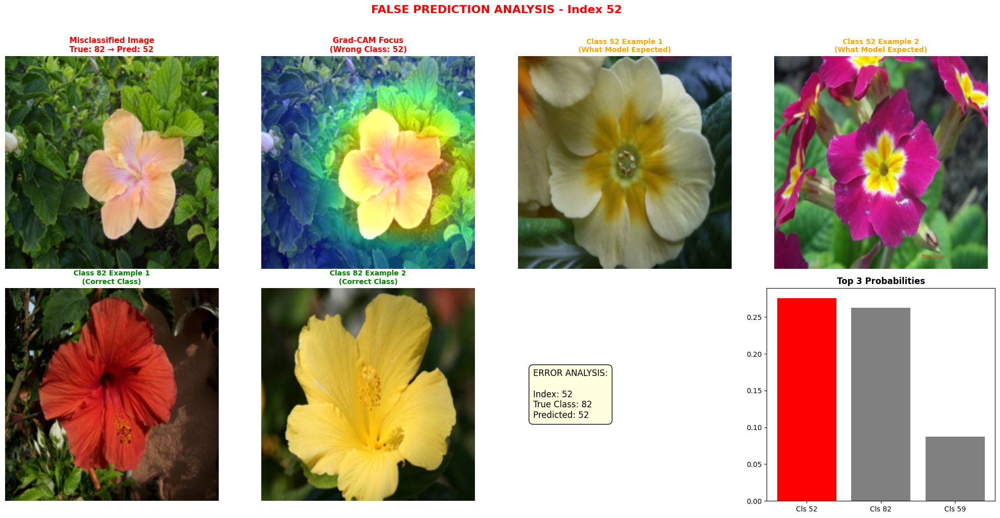


Example 2: Index 85
True Label: 5, Predicted: 100


c:\assesment\flower_env\lib\site-packages\torch\nn\modules\module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


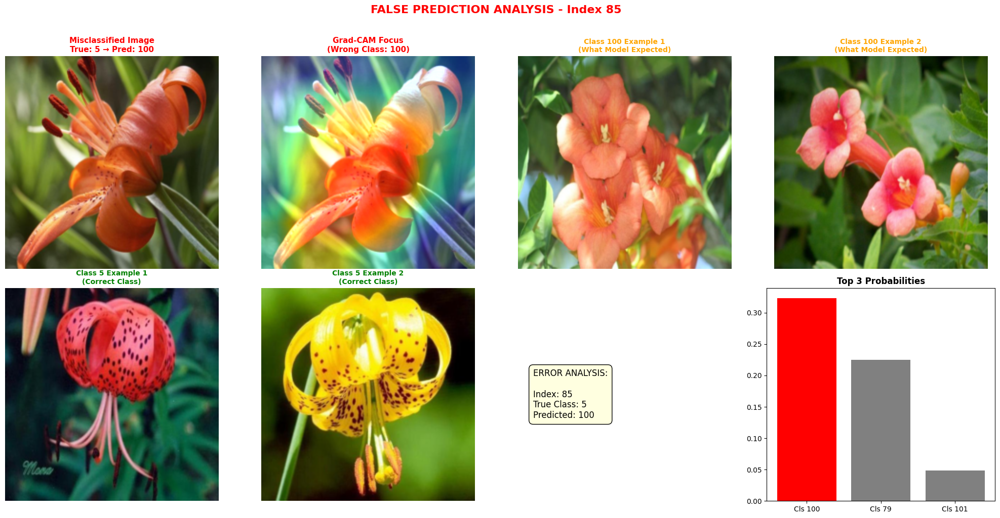

In [188]:
def demo_grad_cam_false_predictions(model, dataset, num_samples=3, seed=None):
    """
    Generate Grad-CAM visualizations for false predictions only.
    Scans for errors first, then RANDOMLY selects examples to visualize.
    """
    # Set random seed for reproducibility if provided
    if seed is not None:
        random.seed(seed)
        torch.manual_seed(seed)

    # Target the last layer of the residual block
    target_layer = model.layer4[-1]
    grad_cam = GradCAM(model, target_layer)
    
    # --- STEP 1: SCAN FOR ERRORS ---
    false_predictions = []
    
    print("Scanning dataset for false predictions...")
    model.eval()
    with torch.no_grad():
        for idx in range(len(dataset)):
            image_tensor, label = dataset[idx]
            input_tensor = image_tensor.unsqueeze(0).to(device)
            
            # Get model prediction
            output = model(input_tensor)
            pred_idx = torch.argmax(output, dim=1).item()
            
            # Check if prediction is wrong
            if pred_idx != label:
                false_predictions.append((idx, label, pred_idx, image_tensor))
            
            # Stop if we have gathered enough candidates (e.g., 10x the requested amount)
            # This prevents scanning the whole dataset if it's huge
            if len(false_predictions) >= num_samples * 10:
                break
    
    if len(false_predictions) == 0:
        print("No false predictions found in the scanned portion!")
        return
    
    # --- STEP 2: RANDOM SELECTION ---
    if len(false_predictions) > num_samples:
        selected_false_predictions = random.sample(false_predictions, num_samples)
        print(f"Found {len(false_predictions)} errors. Randomly selected {num_samples} for analysis.")
    else:
        selected_false_predictions = false_predictions
        print(f"Found {len(false_predictions)} errors. Showing all of them.")

    # Helper function to find examples of a specific class
    def find_class_examples(target_class, exclude_idx=None, num_examples=2):
        examples = []
        # Randomly shuffle indices to get diverse examples
        all_indices = list(range(len(dataset)))
        random.shuffle(all_indices)
        
        for idx in all_indices[:2000]:  # Limit search for performance
            if idx == exclude_idx:
                continue
            img, label = dataset[idx]
            if label == target_class:
                examples.append(img)
                if len(examples) >= num_examples:
                    break
        return examples
    
    # --- STEP 3: VISUALIZATION ---
    for i, (idx, true_label, pred_label, image_tensor) in enumerate(selected_false_predictions):
        print(f"\nExample {i+1}: Index {idx}")
        print(f"True Label: {true_label}, Predicted: {pred_label}")
        
        # Find examples of the predicted (wrong) class
        pred_class_examples = find_class_examples(pred_label, exclude_idx=idx, num_examples=2)
        
        # Find examples of the true class for comparison
        true_class_examples = find_class_examples(true_label, exclude_idx=idx, num_examples=2)
        
        # Create 4-panel visualization (rows x cols)
        plt.figure(figsize=(20, 10))
        
        # Generate Heatmap
        heatmap = grad_cam(image_tensor.unsqueeze(0).to(device), class_idx=pred_label)
        
        inv_normalize = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
            std=[1/0.229, 1/0.224, 1/0.225]
        )
        
        display_img = inv_normalize(image_tensor)
        display_img = display_img.permute(1, 2, 0).cpu().numpy()
        display_img = np.clip(display_img, 0, 1)
        
        # Process heatmap
        heatmap_resized = cv2.resize(heatmap, (display_img.shape[1], display_img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
        superimposed = np.float32(heatmap_rgb) / 255 * 0.4 + display_img
        superimposed = np.clip(superimposed, 0, 1)
        
        # Panel 1: Original Misclassified Image
        plt.subplot(2, 4, 1)
        plt.imshow(display_img)
        plt.title(f"Misclassified Image\nTrue: {true_label} → Pred: {pred_label}", 
                 fontsize=11, fontweight='bold', color='red')
        plt.axis('off')
        
        # Panel 2: Grad-CAM Overlay
        plt.subplot(2, 4, 2)
        plt.imshow(superimposed)
        plt.title(f"Grad-CAM Focus\n(Wrong Class: {pred_label})", 
                 fontsize=11, fontweight='bold', color='red')
        plt.axis('off')
        
        # Panel 3-4: Examples of what the predicted class actually looks like
        for j, example_img in enumerate(pred_class_examples):
            if j < 2:
                plt.subplot(2, 4, 3 + j)
                example_display = inv_normalize(example_img)
                example_display = example_display.permute(1, 2, 0).cpu().numpy()
                example_display = np.clip(example_display, 0, 1)
                plt.imshow(example_display)
                plt.title(f"Class {pred_label} Example {j+1}\n(What Model Expected)", 
                          fontsize=10, fontweight='bold', color='orange')
                plt.axis('off')
        
        # Panel 5-6: Examples of what the true class looks like
        for j, example_img in enumerate(true_class_examples):
            if j < 2:
                plt.subplot(2, 4, 5 + j)
                example_display = inv_normalize(example_img)
                example_display = example_display.permute(1, 2, 0).cpu().numpy()
                example_display = np.clip(example_display, 0, 1)
                plt.imshow(example_display)
                plt.title(f"Class {true_label} Example {j+1}\n(Correct Class)", 
                          fontsize=10, fontweight='bold', color='green')
                plt.axis('off')
        
        # Panel 7: Error analysis text
        plt.subplot(2, 4, 7)
        plt.axis('off')
        error_text = f"ERROR ANALYSIS:\n\nIndex: {idx}\nTrue Class: {true_label}\nPredicted: {pred_label}"
        plt.text(0.1, 0.5, error_text, fontsize=12, verticalalignment='center',
                bbox=dict(boxstyle="round,pad=0.5", facecolor="lightyellow"))
        
        # Panel 8: Model confidence bar chart
        plt.subplot(2, 4, 8)
        with torch.no_grad():
            output = model(image_tensor.unsqueeze(0).to(device))
            probs = torch.nn.functional.softmax(output, dim=1)[0]
        
        top3_probs, top3_indices = torch.topk(probs, 3)
        plt.bar(range(3), top3_probs.cpu().numpy(), color=['red', 'gray', 'gray'])
        plt.xticks(range(3), [f"Cls {idx.item()}" for idx in top3_indices])
        plt.title('Top 3 Probabilities', fontweight='bold')
        
        plt.suptitle(f"FALSE PREDICTION ANALYSIS - Index {idx}", 
                    fontsize=16, fontweight='bold', color='red', y=1.02)
        plt.tight_layout()
        plt.show()

demo_grad_cam_false_predictions(model, test_dataset, num_samples=2, seed=None)